In [16]:
import numpy as np
import pandas as pd

%matplotlib inline
import matplotlib.pyplot as plt

import seaborn as sns

import requests
import plotly.express as px
import pandas as pd
import plotly.graph_objs as go

import geopandas as gpd
from shapely.geometry import Point

from IPython.display import HTML

pd.options.mode.copy_on_write = True

### Intro

Have you ever met a Turkish person who supports Tottenham FC? This map might be your answer. 🗺⚽

Using publicly available census data, I’ve mapped the percentage of people in London who speak Turkish as their main language. Tottenham is at the top the list, making it the area with the highest concentration of Turkish speakers in London.

It’s no surprise then that the local football team, Tottenham Hotspur, might have some unexpected Turkish fans among their supporters considering how much Turks love football!

Maps like these highlight how data analysis can uncover fascinating cultural insights. Whether you’re looking to locate the next big fan group for your sports team, or simply curious about community distributions in urban areas, spatial analysis brings valuable stories to light.

### The percentage of people speaking each language as a main language in 2021

In [18]:
lan = pd.read_excel('data/3-other_languages.xlsx')

In [20]:
lan.head()

,Area code,Area name,English (English or Welsh in Wales)\n(number),Welsh or Cymraeg (in England only)\n(number),Other UK language: Gaelic (Irish)\n(number),Other UK language: Gaelic (Scottish)\n(number),Other UK language: Manx Gaelic\n(number),Other UK language: Gaelic (Not otherwise specified)\n(number),Other UK language: Cornish\n(number),Other UK language: Scots\n(number),...,African language: Lingala\n(percent),African language: Shona\n(percent),African language: Afrikaans\n(percent),African language: Any other Nigerian language\n(percent),African language: Any other West African language\n(percent),African language: Any other African language\n(percent),Sign language: British Sign Language\n(percent),Sign language: Any other sign language\n(percent),Sign language: Any sign communication system\n(percent),Other language\n(percent)
0,E06000001,Hartlepool,87544,4,0,0,0,0,0,3,...,0.0,0.01,0.01,0.00,0.01,0.01,0.05,0.0,0.00,0.00
1,E06000002,Middlesbrough,128306,4,0,1,0,0,0,0,...,0.0,0.01,0.00,0.01,0.01,0.07,0.07,0.0,0.00,0.02
2,E06000003,Redcar and Cleveland,131197,5,0,1,0,0,0,3,...,0.0,0.00,0.00,0.00,0.00,0.00,0.03,0.0,0.01,0.00
3,E06000004,Stockton-on-Tees,184786,5,0,1,0,1,1,3,...,0.0,0.03,0.01,0.00,0.01,0.01,0.06,0.0,0.00,0.01
4,E06000005,Darlington,100200,0,0,1,0,0,0,1,...,0.0,0.00,0.01,0.00,0.00,0.01,0.03,0.0,0.00,0.00


### The percentage of people speaking Turkish as a main language in 2021

In [22]:
tr = lan.filter(regex='(Turk)|(Area)')

In [54]:
tr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 331 entries, 0 to 330
Data columns (total 5 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Area code          331 non-null    object 
 1   Area name          331 non-null    object 
 2   Turkish
(number)   331 non-null    int64  
 3   Turkish
(percent)  331 non-null    float64
 4   log pct            331 non-null    float64
dtypes: float64(2), int64(1), object(2)
memory usage: 13.1+ KB


In [72]:
tr['log_pct'] = np.log1p(tr['Turkish\n(percent)'])

tr

,Area code,Area name,Turkish\n(number),Turkish\n(percent),log pct,log_pct
0,E06000001,Hartlepool,34,0.04,0.039221,0.039221
1,E06000002,Middlesbrough,39,0.03,0.029559,0.029559
2,E06000003,Redcar and Cleveland,13,0.01,0.009950,0.009950
3,E06000004,Stockton-on-Tees,41,0.02,0.019803,0.019803
4,E06000005,Darlington,46,0.04,0.039221,0.039221
...,...,...,...,...,...,...
326,W06000020,Torfaen,24,0.03,0.029559,0.029559
327,W06000021,Monmouthshire,29,0.03,0.029559,0.029559
328,W06000022,Newport,256,0.17,0.157004,0.157004
329,W06000023,Powys,65,0.05,0.048790,0.048790


## Choropleth Map

In [26]:
# Local Authority Districts Boundaries UK BUC (2021)

# Fetch the GeoJSON data from web
response_boundary = requests.get(
    #"https://services1.arcgis.com/ESMARspQHYMw9BZ9/arcgis/rest/services/LAD_Dec_2021_GB_BFC_2022/FeatureServer/0/query?outFields=*&where=1%3D1&f=geojson"
    "https://services1.arcgis.com/ESMARspQHYMw9BZ9/arcgis/rest/services/Local_Authority_Districts_December_2021_UK_BUC_2022/FeatureServer/0/query?outFields=*&where=1%3D1&f=geojson"
) # requests is the library, get() sends an HTTP GET request to the specified URL. It retrieves data from the server and returns a Response object. 

# Convert the JSON response object to a dictionary
# This dictionary contains a featurecollection
# FeatureCollection = An object defining a layer of features whose geometry and attributes will be stored directly within the web map
dict_boundary = response_boundary.json() 

# Convert the data to a GeoDataFrame
gdf_boundary = gpd.GeoDataFrame.from_features(dict_boundary['features'], crs="EPSG:4326")


In [78]:
######### JOINED

gdf_tr = tr.merge(gdf_boundary, left_on='Area code', right_on='LAD21CD')

gdf_tr = gpd.GeoDataFrame(gdf_tr, geometry=gdf_tr.geometry)


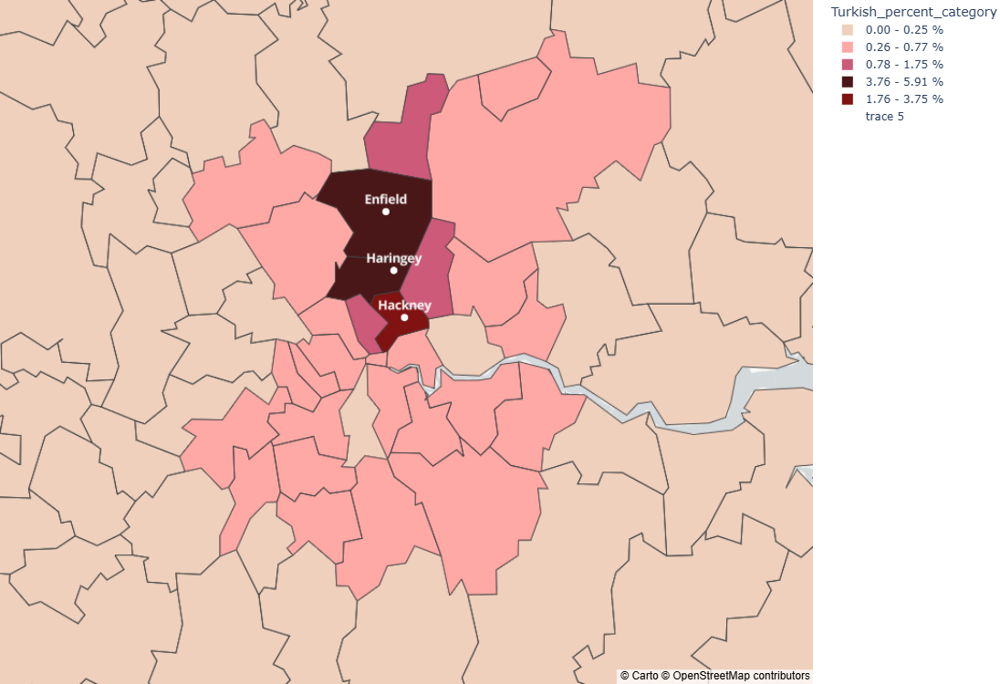

In [107]:
import plotly.express as px
import pandas as pd

gdf_tr['Turkish_percent'] = gdf_tr['Turkish\n(percent)']  # Adjust column name if necessary

# Define bins and labels for the percentages
bins = [0.00, 0.25, 0.77, 1.75, 3.75, 5.91]
labels = ['0.00 - 0.25 %', '0.26 - 0.77 %', '0.78 - 1.75 %', '1.76 - 3.75 %', '3.76 - 5.91 %']

# Create a new column for the categorized data
gdf_tr['Turkish_percent_category'] = pd.cut(
    gdf_tr['Turkish_percent'], bins=bins, labels=labels, include_lowest=True
)

# Define a discrete color scale for the categories
color_scale = ['#eed0bc', '#ffa9a6', '#cc5a78', '#491717','#811212']

# Locations and their coordinates (Longitude, Latitude)
locations = {
    "Enfield": [-0.081, 51.652],
    "Haringey": [-0.069, 51.597],
    #"Wood Green": [-0.110, 51.596],
    #"Dalston": [-0.075, 51.548],
    "Hackney": [-0.053, 51.553]
}

# Create the map
fig = px.choropleth_mapbox(
    gdf_tr,
    geojson=gdf_tr.geometry.__geo_interface__,
    locations=gdf_tr.index,
    color="Turkish_percent_category",
    color_discrete_sequence=color_scale,
    opacity=1,
    width=1000, height=750
).update_layout(
    mapbox={
        "style": "carto-positron",
        "center": {"lon": -0.05, "lat": 51.53},
        "zoom": 9
    },
    margin={"l": 0, "r": 0, "t": 0, "b": 0}
)

# Add labels as scattermapbox overlay
fig.add_scattermapbox(
    mode="markers+text",
    lon=[coord[0] for coord in locations.values()],
    lat=[coord[1] for coord in locations.values()],
    text=list(locations.keys()),
    marker=dict(size=9, color="white"),
    textfont=dict(size=14, color="white", weight = 'bold'),
    textposition="top center"  # Position the text above the marker
)

fig.show()


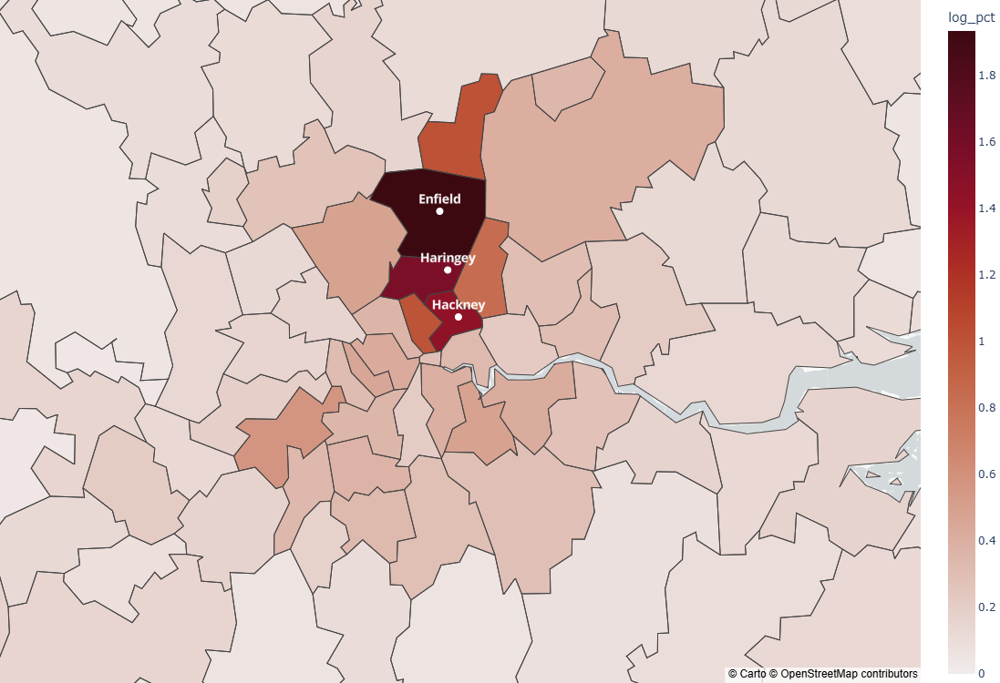

In [105]:

# Locations and their coordinates (Longitude, Latitude)
locations = {
    "Enfield": [-0.081, 51.652],
    "Haringey": [-0.069, 51.597],
    #"Wood Green": [-0.110, 51.596],
    #"Dalston": [-0.075, 51.548],
    "Hackney": [-0.053, 51.553]
}

# Create the map
fig = px.choropleth_mapbox(
    gdf_tr,
    geojson=gdf_tr.geometry.__geo_interface__,
    locations=gdf_tr.index,
    color="log_pct",
    color_continuous_scale='amp', #''Reds', #px.colors.sequential.Cividis_r, #px.colors.diverging.BrBG, 
    opacity=1,
    width=1000, height=750
).update_layout(
    mapbox={
        "style": "carto-positron",
        "center": {"lon": -0.05, "lat": 51.53},
        "zoom": 9
    },
    margin={"l": 0, "r": 0, "t": 0, "b": 0}
)

# Add labels as scattermapbox overlay
fig.add_scattermapbox(
    mode="markers+text",
    lon=[coord[0] for coord in locations.values()],
    lat=[coord[1] for coord in locations.values()],
    text=list(locations.keys()),
    marker=dict(size=9, color="white"),
    textfont=dict(size=14, color="white", weight = 'bold'),
    textposition="top center"  # Position the text above the marker
)

fig.show()
